In [8]:
import os
import numpy.fft, os, scipy.signal, traceback,soundfile,seaborn
import matplotlib.pyplot as plt
import librosa
import numpy as np

def get_lang_dir(base_path):
    # 初始化一个列表来存储 clip 文件夹的路径
    clip_directories = []

    # 遍历 sounds 文件夹下的每个子文件夹
    for language in os.listdir(base_path):
        # 构建当前语言文件夹的路径
        language_path = os.path.join(base_path, language)
        
        # 检查这个路径是否为目录
        if os.path.isdir(language_path):
            # 构建 clip 文件夹的预期路径
            clip_path = os.path.join(language_path, 'clips')
            
            # 检查 clip 文件夹是否存在
            if os.path.exists(clip_path) and os.path.isdir(clip_path):
                # 如果存在，添加到列表中
                clip_directories.append(clip_path)
    return clip_directories

def find_mp3_files(directory):
    """
    这个函数接收一个目录的路径，并返回该目录及其所有子目录中的所有.mp3文件的完整路径。
    """
    mp3_files = []
    # 使用 os.walk 遍历目录
    for root, dirs, files in os.walk(directory):
        for file in files:
            # 检查文件扩展名是否为 .mp3
            if file.endswith('.mp3'):
                # 构建文件的完整路径
                full_path = os.path.join(root, file)
                # 将文件路径添加到列表中
                mp3_files.append(full_path)
    
    return mp3_files

def butter_bandpass_filter(data, lowcut, highcut, fs, order=3):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    # Not sure why a bandpass doesn't work
    b, a = scipy.signal.butter(order, high, btype='low')
    data = scipy.signal.lfilter(b, a, data)
    b, a = scipy.signal.butter(order, low, btype='high')
    data = scipy.signal.lfilter(b, a, data)
    return data

def trim(sig, fs, s):
    samples = int(s * fs)
    c = numpy.cumsum(abs(sig))
    i = numpy.argmax(c[samples:] - c[:-samples])    
    lo, hi = i, i+samples
    return sig[lo:hi]

def get_signal(fn, trim_s=0.5):
    try:
        signal, fs = soundfile.read(fn)
        signal = butter_bandpass_filter(signal, 50., 8000., fs)
        signal = trim(signal, fs, trim_s)
        assert len(signal) == int(fs * trim_s)
    except:
        traceback.print_exc()
        return None
    return signal

def freq_from_fft(signal, fs):
    windowed = signal * scipy.signal.kaiser(len(signal), 14)
    f = numpy.fft.rfft(windowed)
    hz_factor = 1.0 * fs / len(signal)
    return f, hz_factor

def read_sound(file_path,sr=None):
    audio, sr = librosa.load(file_path, sr=sr)
    return audio,sr

def plot_fft(df, n, fn):
        print('plotting %s' % fn)
        colors = seaborn.color_palette('hls', n)
        fig = plt.figure(figsize=(9, 6))
        for row, color in zip(df['freqs'][:n], colors):
            plt.plot(numpy.arange(len(row)) * hz_factor, row, color=color)
        plt.xlim([0, 500])
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('FFT coefficient magnitude')
        fig.tight_layout()
        plt.savefig(fn, dpi=300)

In [9]:
lang_name={
 '/home/jyun/sounds/de/clips':"German",
 '/home/jyun/sounds/el/clips':"Greek",
 '/home/jyun/sounds/en/clips':"English",
 '/home/jyun/sounds/es/clips':"Spanish",
 '/home/jyun/sounds/fr/clips':"French",
 '/home/jyun/sounds/it/clips':"Italian",
 '/home/jyun/sounds/ja/clips':"Japanese",
 '/home/jyun/sounds/yue/clips':"Cantonese",
 '/home/jyun/sounds/cn/clips':"Mandarin"
 }

lang_dir=get_lang_dir('/home/jyun/sounds')
fs = 22050
df={}
for clips_folder_path in lang_dir:
    print(clips_folder_path)
    mp3_files = find_mp3_files(clips_folder_path)
    mag=[]
    for file_path in mp3_files:
        try:
            sound_arr=get_signal(file_path)
            f, hz_factor=freq_from_fft(sound_arr,fs)
            magnitude = np.abs(f)[:8000]
            mag.append(magnitude)
        except:
            print(mp3_files)
        if df=={}:
            frequencies = np.arange(0, len(f)) * hz_factor
            frequencies=frequencies[:8000]

    mag=np.mean(mag, axis=0)
    df[clips_folder_path]=mag

    

    

#plot_fft(df[(df['lang'] == 'English') & (df['gender'] == 'female')], 10, 'pics/ffts.png')


/home/jyun/sounds/de/clips
/home/jyun/sounds/el/clips
/home/jyun/sounds/en/clips


Traceback (most recent call last):
  File "/tmp/ipykernel_776864/1635649269.py", line 66, in get_signal
    signal = trim(signal, fs, trim_s)
  File "/tmp/ipykernel_776864/1635649269.py", line 58, in trim
    i = numpy.argmax(c[samples:] - c[:-samples])
  File "<__array_function__ internals>", line 200, in argmax
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 1242, in argmax
    return _wrapfunc(a, 'argmax', axis=axis, out=out, **kwds)
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 57, in _wrapfunc
    return bound(*args, **kwds)
ValueError: attempt to get argmax of an empty sequence


['/home/jyun/sounds/en/clips/common_voice_en_39610581.mp3', '/home/jyun/sounds/en/clips/common_voice_en_39710589.mp3', '/home/jyun/sounds/en/clips/common_voice_en_39610590.mp3', '/home/jyun/sounds/en/clips/common_voice_en_39710598.mp3', '/home/jyun/sounds/en/clips/common_voice_en_39610591.mp3', '/home/jyun/sounds/en/clips/common_voice_en_39710599.mp3', '/home/jyun/sounds/en/clips/common_voice_en_39612631.mp3', '/home/jyun/sounds/en/clips/common_voice_en_39712639.mp3', '/home/jyun/sounds/en/clips/common_voice_en_39623200.mp3', '/home/jyun/sounds/en/clips/common_voice_en_39723208.mp3', '/home/jyun/sounds/en/clips/common_voice_en_39623861.mp3', '/home/jyun/sounds/en/clips/common_voice_en_39723869.mp3', '/home/jyun/sounds/en/clips/common_voice_en_39623870.mp3', '/home/jyun/sounds/en/clips/common_voice_en_39723878.mp3', '/home/jyun/sounds/en/clips/common_voice_en_39623871.mp3', '/home/jyun/sounds/en/clips/common_voice_en_39723879.mp3', '/home/jyun/sounds/en/clips/common_voice_en_39623888.mp

Traceback (most recent call last):
  File "/tmp/ipykernel_776864/1635649269.py", line 66, in get_signal
    signal = trim(signal, fs, trim_s)
  File "/tmp/ipykernel_776864/1635649269.py", line 58, in trim
    i = numpy.argmax(c[samples:] - c[:-samples])
  File "<__array_function__ internals>", line 200, in argmax
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 1242, in argmax
    return _wrapfunc(a, 'argmax', axis=axis, out=out, **kwds)
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 57, in _wrapfunc
    return bound(*args, **kwds)
ValueError: attempt to get argmax of an empty sequence


['/home/jyun/sounds/ja/clips/common_voice_ja_39646148.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746140.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39646149.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746141.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653791.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753799.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653801.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753809.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653819.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753811.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653820.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753828.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653821.mp

Traceback (most recent call last):
  File "/tmp/ipykernel_776864/1635649269.py", line 66, in get_signal
    signal = trim(signal, fs, trim_s)
  File "/tmp/ipykernel_776864/1635649269.py", line 58, in trim
    i = numpy.argmax(c[samples:] - c[:-samples])
  File "<__array_function__ internals>", line 200, in argmax
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 1242, in argmax
    return _wrapfunc(a, 'argmax', axis=axis, out=out, **kwds)
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 57, in _wrapfunc
    return bound(*args, **kwds)
ValueError: attempt to get argmax of an empty sequence


['/home/jyun/sounds/ja/clips/common_voice_ja_39646148.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746140.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39646149.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746141.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653791.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753799.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653801.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753809.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653819.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753811.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653820.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753828.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653821.mp

Traceback (most recent call last):
  File "/tmp/ipykernel_776864/1635649269.py", line 66, in get_signal
    signal = trim(signal, fs, trim_s)
  File "/tmp/ipykernel_776864/1635649269.py", line 58, in trim
    i = numpy.argmax(c[samples:] - c[:-samples])
  File "<__array_function__ internals>", line 200, in argmax
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 1242, in argmax
    return _wrapfunc(a, 'argmax', axis=axis, out=out, **kwds)
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 57, in _wrapfunc
    return bound(*args, **kwds)
ValueError: attempt to get argmax of an empty sequence


['/home/jyun/sounds/ja/clips/common_voice_ja_39646148.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746140.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39646149.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746141.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653791.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753799.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653801.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753809.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653819.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753811.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653820.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753828.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653821.mp

Traceback (most recent call last):
  File "/tmp/ipykernel_776864/1635649269.py", line 66, in get_signal
    signal = trim(signal, fs, trim_s)
  File "/tmp/ipykernel_776864/1635649269.py", line 58, in trim
    i = numpy.argmax(c[samples:] - c[:-samples])
  File "<__array_function__ internals>", line 200, in argmax
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 1242, in argmax
    return _wrapfunc(a, 'argmax', axis=axis, out=out, **kwds)
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 57, in _wrapfunc
    return bound(*args, **kwds)
ValueError: attempt to get argmax of an empty sequence
Traceback (most recent call last):
  File "/tmp/ipykernel_776864/1635649269.py", line 66, in get_signal
    signal = trim(signal, fs, trim_s)
  File "/tmp/ipykernel_776864/1635649269.py", line 58, in trim
    i = numpy.argmax(c[samples:] - c[:-samples])
  File "<__array_function__ internals>", line 200, in argma

['/home/jyun/sounds/ja/clips/common_voice_ja_39646148.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746140.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39646149.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746141.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653791.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753799.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653801.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753809.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653819.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753811.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653820.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753828.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653821.mp

Traceback (most recent call last):
  File "/tmp/ipykernel_776864/1635649269.py", line 66, in get_signal
    signal = trim(signal, fs, trim_s)
  File "/tmp/ipykernel_776864/1635649269.py", line 58, in trim
    i = numpy.argmax(c[samples:] - c[:-samples])
  File "<__array_function__ internals>", line 200, in argmax
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 1242, in argmax
    return _wrapfunc(a, 'argmax', axis=axis, out=out, **kwds)
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 57, in _wrapfunc
    return bound(*args, **kwds)
ValueError: attempt to get argmax of an empty sequence


['/home/jyun/sounds/ja/clips/common_voice_ja_39646148.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746140.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39646149.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746141.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653791.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753799.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653801.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753809.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653819.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753811.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653820.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753828.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653821.mp

Traceback (most recent call last):
  File "/tmp/ipykernel_776864/1635649269.py", line 66, in get_signal
    signal = trim(signal, fs, trim_s)
  File "/tmp/ipykernel_776864/1635649269.py", line 58, in trim
    i = numpy.argmax(c[samples:] - c[:-samples])
  File "<__array_function__ internals>", line 200, in argmax
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 1242, in argmax
    return _wrapfunc(a, 'argmax', axis=axis, out=out, **kwds)
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 57, in _wrapfunc
    return bound(*args, **kwds)
ValueError: attempt to get argmax of an empty sequence


['/home/jyun/sounds/ja/clips/common_voice_ja_39646148.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746140.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39646149.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746141.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653791.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753799.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653801.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753809.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653819.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753811.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653820.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753828.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653821.mp

Traceback (most recent call last):
  File "/tmp/ipykernel_776864/1635649269.py", line 66, in get_signal
    signal = trim(signal, fs, trim_s)
  File "/tmp/ipykernel_776864/1635649269.py", line 58, in trim
    i = numpy.argmax(c[samples:] - c[:-samples])
  File "<__array_function__ internals>", line 200, in argmax
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 1242, in argmax
    return _wrapfunc(a, 'argmax', axis=axis, out=out, **kwds)
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 57, in _wrapfunc
    return bound(*args, **kwds)
ValueError: attempt to get argmax of an empty sequence


['/home/jyun/sounds/ja/clips/common_voice_ja_39646148.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746140.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39646149.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746141.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653791.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753799.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653801.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753809.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653819.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753811.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653820.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753828.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653821.mp

Traceback (most recent call last):
  File "/tmp/ipykernel_776864/1635649269.py", line 66, in get_signal
    signal = trim(signal, fs, trim_s)
  File "/tmp/ipykernel_776864/1635649269.py", line 58, in trim
    i = numpy.argmax(c[samples:] - c[:-samples])
  File "<__array_function__ internals>", line 200, in argmax
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 1242, in argmax
    return _wrapfunc(a, 'argmax', axis=axis, out=out, **kwds)
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 57, in _wrapfunc
    return bound(*args, **kwds)
ValueError: attempt to get argmax of an empty sequence


['/home/jyun/sounds/ja/clips/common_voice_ja_39646148.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746140.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39646149.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746141.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653791.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753799.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653801.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753809.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653819.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753811.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653820.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753828.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653821.mp

Traceback (most recent call last):
  File "/tmp/ipykernel_776864/1635649269.py", line 66, in get_signal
    signal = trim(signal, fs, trim_s)
  File "/tmp/ipykernel_776864/1635649269.py", line 58, in trim
    i = numpy.argmax(c[samples:] - c[:-samples])
  File "<__array_function__ internals>", line 200, in argmax
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 1242, in argmax
    return _wrapfunc(a, 'argmax', axis=axis, out=out, **kwds)
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 57, in _wrapfunc
    return bound(*args, **kwds)
ValueError: attempt to get argmax of an empty sequence


['/home/jyun/sounds/ja/clips/common_voice_ja_39646148.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746140.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39646149.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746141.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653791.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753799.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653801.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753809.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653819.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753811.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653820.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753828.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653821.mp

Traceback (most recent call last):
  File "/tmp/ipykernel_776864/1635649269.py", line 66, in get_signal
    signal = trim(signal, fs, trim_s)
  File "/tmp/ipykernel_776864/1635649269.py", line 58, in trim
    i = numpy.argmax(c[samples:] - c[:-samples])
  File "<__array_function__ internals>", line 200, in argmax
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 1242, in argmax
    return _wrapfunc(a, 'argmax', axis=axis, out=out, **kwds)
  File "/home/jyun/.conda/envs/bm/lib/python3.8/site-packages/numpy/core/fromnumeric.py", line 57, in _wrapfunc
    return bound(*args, **kwds)
ValueError: attempt to get argmax of an empty sequence


['/home/jyun/sounds/ja/clips/common_voice_ja_39646148.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746140.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39646149.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39746141.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653791.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753799.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653801.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753809.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653808.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753800.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653819.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753811.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653820.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39753828.mp3', '/home/jyun/sounds/ja/clips/common_voice_ja_39653821.mp

In [10]:
# 将字典存储为 JSON 文件
for key in df:
    df[key] = df[key].tolist()
import json
with open('data2.json', 'w') as json_file:
    json.dump(df, json_file)

## 读取 JSON 文件
with open('data2.json', 'r') as json_file:
    loaded_dict = json.load(json_file)
'''
def draw_np_array(np_array):
    plt.scatter(np.arange(len(np_array)), np_array, s=1)
    plt.title('Scatter Plot of NumPy Array')
    plt.xlabel('Index')
    plt.ylabel('Values')
    plt.show()
draw_np_array(loaded_dict['/home/jyun/sounds/yue/clips'])
draw_np_array(loaded_dict['/home/jyun/sounds/cn/clips'])
draw_np_array(loaded_dict['/home/jyun/sounds/en/clips'])
draw_np_array(loaded_dict['/home/jyun/sounds/it/clips'])
draw_np_array(loaded_dict['/home/jyun/sounds/de/clips'])
draw_np_array(loaded_dict['/home/jyun/sounds/fr/clips'])
draw_np_array(loaded_dict['/home/jyun/sounds/ja/clips'])
draw_np_array(loaded_dict['/home/jyun/sounds/el/clips'])
draw_np_array(loaded_dict['/home/jyun/sounds/es/clips'])
'''

"\ndef draw_np_array(np_array):\n    plt.scatter(np.arange(len(np_array)), np_array, s=1)\n    plt.title('Scatter Plot of NumPy Array')\n    plt.xlabel('Index')\n    plt.ylabel('Values')\n    plt.show()\ndraw_np_array(loaded_dict['/home/jyun/sounds/yue/clips'])\ndraw_np_array(loaded_dict['/home/jyun/sounds/cn/clips'])\ndraw_np_array(loaded_dict['/home/jyun/sounds/en/clips'])\ndraw_np_array(loaded_dict['/home/jyun/sounds/it/clips'])\ndraw_np_array(loaded_dict['/home/jyun/sounds/de/clips'])\ndraw_np_array(loaded_dict['/home/jyun/sounds/fr/clips'])\ndraw_np_array(loaded_dict['/home/jyun/sounds/ja/clips'])\ndraw_np_array(loaded_dict['/home/jyun/sounds/el/clips'])\ndraw_np_array(loaded_dict['/home/jyun/sounds/es/clips'])\n"

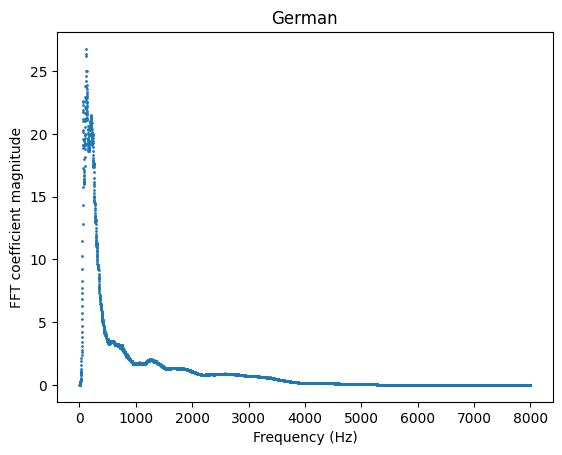

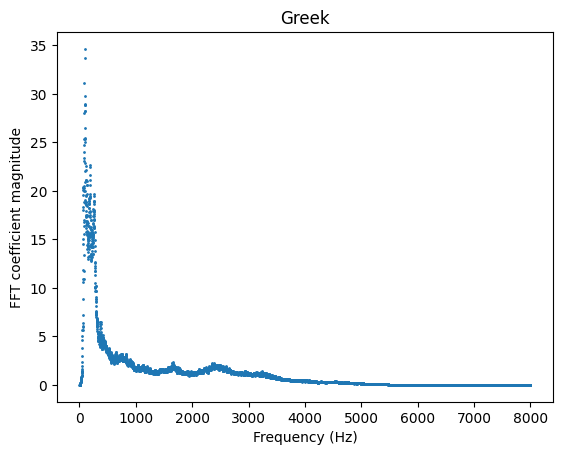

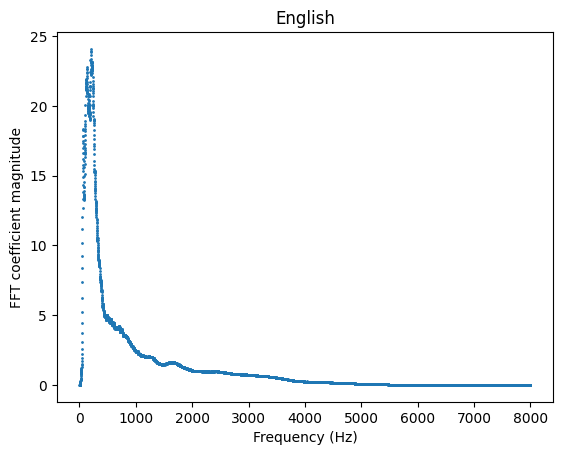

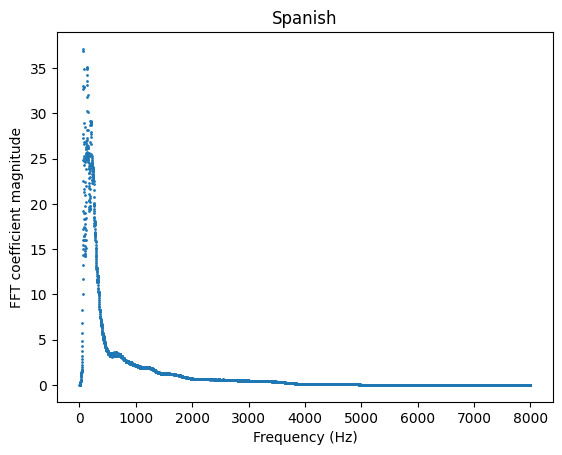

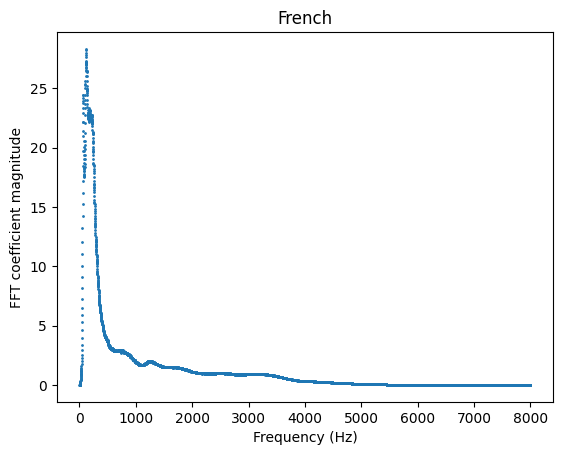

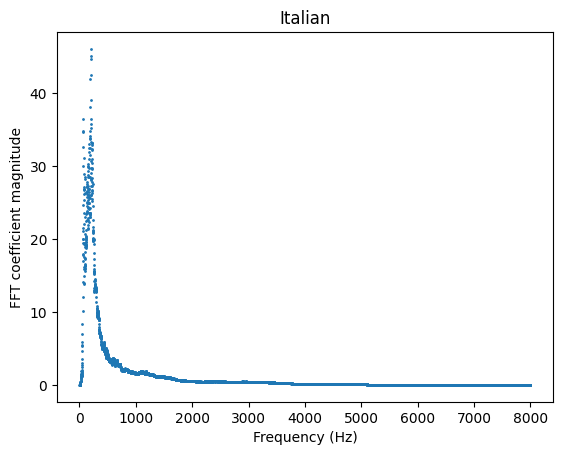

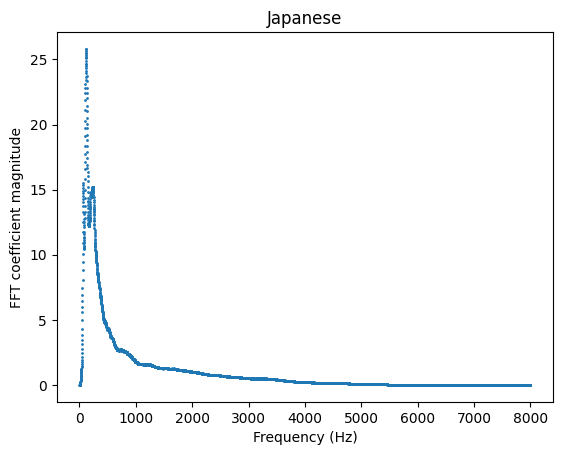

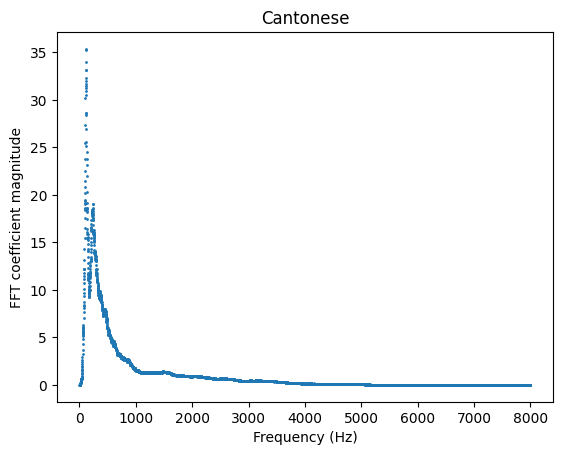

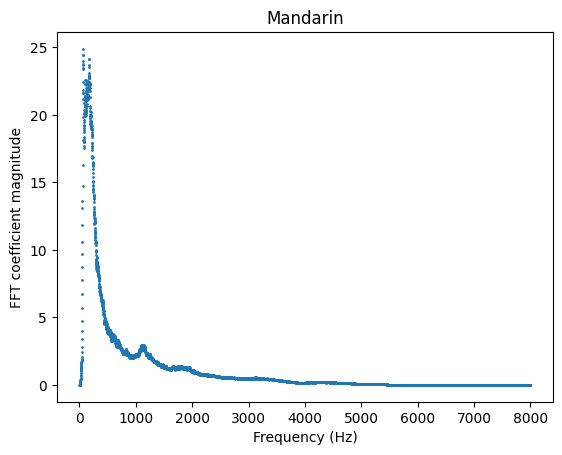

In [11]:
def draw_np_array(np_array,title):
    plt.scatter(np.arange(len(np_array)), np_array, s=1)
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('FFT coefficient magnitude')
    plt.show()
for i in loaded_dict:
    draw_np_array(loaded_dict[i],lang_name[i])
